# HW2 Distribution - Gamma Test and Extreme Events 

In [2]:
### load module

import numpy as np
import pandas as pd
import xarray as xr
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from scipy.stats import stats, gamma, norm, genextreme, genpareto

## Part I. Gamma Dist. for Monthly Data

In [66]:
### define a function to groupby data by month

def to_monthly(ds):
    year = ds.time.dt.year
    month = ds.time.dt.month

    # assign new coords
    ds = ds.assign_coords(year=("time", year.data), month=("time", month.data))

    # reshape the array to (..., "month", "year")
    return ds.set_index(time=("year", "month")).unstack("time")  

    # choose only monthly
    #return ds['month']

In [67]:
### open data

df = xr.open_dataset('../data/era5_tp_Midwest_monthly.nc')

### tes

df_month = to_monthly(df)

In [73]:
df

<xarray.Dataset>
Dimensions:  (time: 504)
Coordinates:
  * time     (time) datetime64[ns] 1979-01-31 1979-02-28 ... 2020-12-31
Data variables:
    tp       (time) float32 ...

### No. 1

Fit a gamma distribution for each month, report the estimated $\alpha$ (shape) and $\beta$ (scale), and then caharecterizes each month precipitation based on the estimated parameters.

In [69]:
### plot the monthly data over 42 years
months = ['January', 'February', 'March', 'April', 'May', 'June',  'July', 'August',
          'September', 'October', 'November', 'December']
num_rows, num_columns = 4, 3
fig, our_axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 15), dpi=1000) 
monthly_axes = [ax for ax_row in our_axes for ax in ax_row]

sb_dark = sns.dark_palette('skyblue', 8, reverse=True)
sns.set(palette=sb_dark)
 
for i, month in enumerate(months):
    # select data for monthly groupby
    current_month_data = df_month.tp[:,i] 
    #print(current_month_data)

    # plot histogram for each month
    current_ax = monthly_axes[i]
    current_ax.hist(current_month_data) 
    current_ax.set_xlim(0, 200)
    current_ax.set_ylim(0, 14)
    current_ax.set_title(month) 
    current_ax.set_ylabel('Counts')
    current_ax.grid(False) 

    # print parameters for gamma dist. for each month
    shape, loc, scale = gamma.fit(current_month_data, floc=0)
    #print(shape, loc, scale)

    x = np.linspace(0, max(current_month_data).item() + 2, 1000)
    #print(max(current_month_data).item())
    #print(x)

    current_ax_twin = current_ax.twinx() 
    current_ax_twin.grid(False)

    #gamma2_lab = r"$gamma (\alpha=%.2f, \beta=%.2f$" % (shape, scale) + ")"
    gamma2_lab = "Gamma Dist. ($\\alpha=%.2f, \\beta=%.2f$" % (shape, scale) + ")"
    current_ax_twin.plot(x, gamma.pdf(x, a=shape, scale=scale), 
                    color=sb_dark[5], label=gamma2_lab)
    current_ax_twin.set_ylim(0, 0.03)
    current_ax_twin.legend()
    
    fig.tight_layout()

### No. 2

- Use cdf fit gamma for each month data and calculate their quartiles and median
- Analyze the seasonality precip from the statistics 
- Compare these results with empirical estimation

In [71]:
### find the statistics (quartile and median) from fitted gamma cdf
num_rows, num_columns = 4, 3
fig, our_axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 15), dpi=1000) 
monthly_axes = [ax for ax_row in our_axes for ax in ax_row]

for i, month in enumerate(months):
    # select data for monthly groupby
    current_month_data = df_month.tp[:,i] 

    # print parameters for gamma dist. for each month
    shape, loc, scale = gamma.fit(current_month_data, floc=0)

    #calculate quantiles from gamma cdf with fitted parameters
    stat = (0.25, 0.5, 0.75) #low quartile, median, and upper quartile
    cum_month_data = gamma.ppf(stat, a=shape, scale=scale)
    print(months[i])
    print("Lower-quartile = %.2f, Median = %.2f, Upper-quartile = %.2f" % \
        (cum_month_data[0], cum_month_data[1], cum_month_data[2]) + "")

    # print parameters for gamma dist. for each month
    shape, loc, scale = gamma.fit(current_month_data, floc=0)

    x = np.linspace(0, max(current_month_data).item() + 2, 1000)

    # plot histogram for each month
    current_ax = monthly_axes[i]
    current_ax.plot(x, gamma.cdf(x, a=shape, scale=scale), 
                    color=sb_dark[5], label=gamma2_lab) 
    current_ax.set_xlim(0, 200)
    current_ax.set_title(month) 
    current_ax.set_ylabel('Cumulative Probability')
    current_ax.grid(False) 
    
    fig.tight_layout()
    

January
Lower-quartile = 45.09, Median = 57.64, Upper-quartile = 72.32
February
Lower-quartile = 44.69, Median = 54.84, Upper-quartile = 66.43
March
Lower-quartile = 64.38, Median = 76.41, Upper-quartile = 89.86
April
Lower-quartile = 82.66, Median = 96.88, Upper-quartile = 112.65
May
Lower-quartile = 89.76, Median = 107.00, Upper-quartile = 126.31
June
Lower-quartile = 84.26, Median = 102.39, Upper-quartile = 122.95
July
Lower-quartile = 84.19, Median = 96.31, Upper-quartile = 109.53
August
Lower-quartile = 81.47, Median = 94.25, Upper-quartile = 108.30
September
Lower-quartile = 75.09, Median = 89.43, Upper-quartile = 105.50
October
Lower-quartile = 69.59, Median = 85.74, Upper-quartile = 104.22
November
Lower-quartile = 61.66, Median = 77.53, Upper-quartile = 95.93
December
Lower-quartile = 57.02, Median = 69.44, Upper-quartile = 83.55


In [72]:
### find the statistics (quartile and median) using EDA

for i, month in enumerate(months):
    # select data for monthly groupby
    current_month_data = df_month.tp[:,i] 

    #calculate quantiles from EDA
    stat = [0.25, 0.5, 0.75] #low quartile, median, and upper quartile
    eda_quantiles = current_month_data.quantile(stat)
    print(months[i])
    print("Lower-quartile = %.2f, Median = %.2f, Upper-quartile = %.2f" % \
        (eda_quantiles[0], eda_quantiles[1], eda_quantiles[2]) + "")

January
Lower-quartile = 45.91, Median = 56.83, Upper-quartile = 74.93
February
Lower-quartile = 42.20, Median = 53.95, Upper-quartile = 63.56
March
Lower-quartile = 64.09, Median = 76.65, Upper-quartile = 90.39
April
Lower-quartile = 79.69, Median = 95.13, Upper-quartile = 117.23
May
Lower-quartile = 94.77, Median = 112.13, Upper-quartile = 126.06
June
Lower-quartile = 89.56, Median = 106.11, Upper-quartile = 126.22
July
Lower-quartile = 84.29, Median = 95.96, Upper-quartile = 107.62
August
Lower-quartile = 82.41, Median = 92.87, Upper-quartile = 108.02
September
Lower-quartile = 77.04, Median = 87.79, Upper-quartile = 103.45
October
Lower-quartile = 68.06, Median = 91.19, Upper-quartile = 102.81
November
Lower-quartile = 64.48, Median = 75.50, Upper-quartile = 93.79
December
Lower-quartile = 54.65, Median = 66.69, Upper-quartile = 81.75


### No. 3

- Present superposstions for July and December monthly precip. of the fitted Gamma distribution

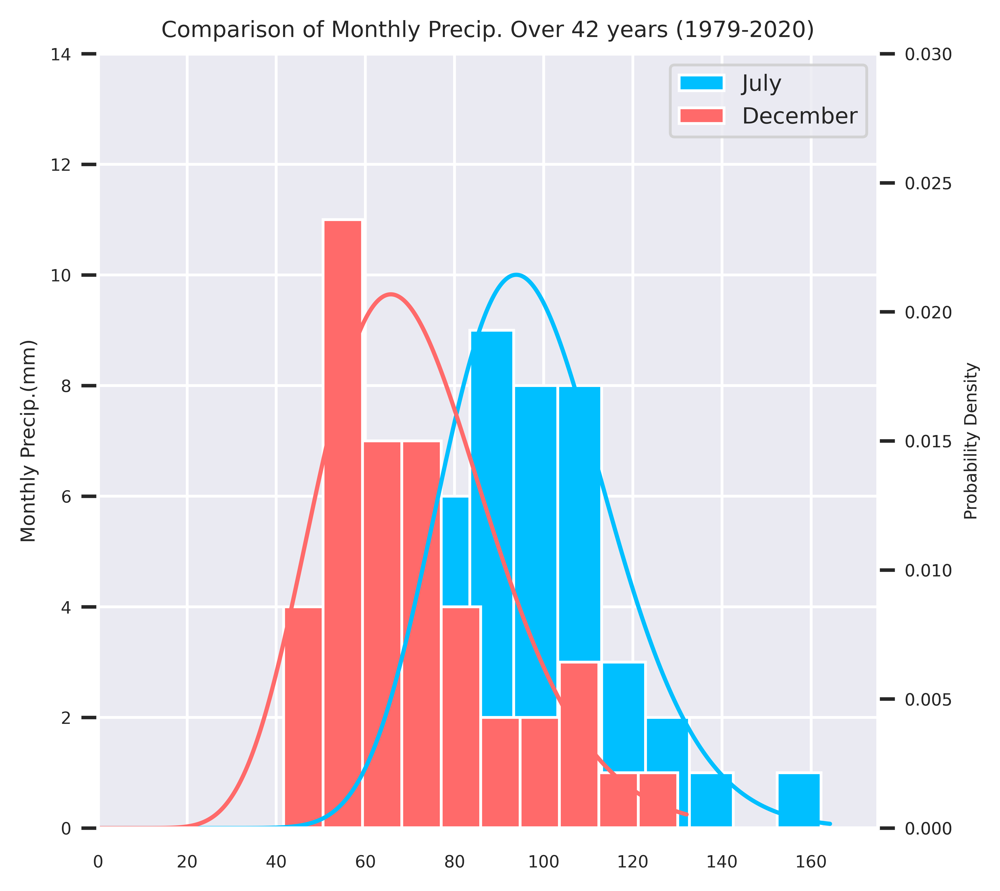

In [76]:
### plot the monthly data over 42 years
months = ['July', 'December']

fig, axes = plt.subplots(1, 1, figsize=(5, 5), dpi=1000) 

#sb_dark = sns.dark_palette('skyblue', 8, reverse=True)
#sns.set(palette=sb_dark)
color = ['#00BFFF', '#FF6A6A']
my_labels = ['July', 'December']

df_month_sel = df_month.tp[:,[6, 11]]

for i, month in enumerate(months):
    # select data for monthly groupby
    current_month_data = df_month_sel[:,i]

    # plot histogram for each month
    current_ax = axes
    current_ax.hist(current_month_data, color=color[i], label=my_labels[i]) 
    current_ax.set_xlim(0, 175)
    current_ax.set_ylim(0, 14)
    current_ax.set_ylabel('Counts', fontsize=7)
    current_ax.set_ylabel('Monthly Precip.(mm)', fontsize=7)
    current_ax.grid(True) 
    current_ax.legend(fontsize=8)
    current_ax.set_title('Comparison of Monthly Precip. Over 42 years (1979-2020)', fontsize=8)
    current_ax.tick_params(axis='both', which='major', labelsize=6)

    # print parameters for gamma dist. for each month
    shape, loc, scale = gamma.fit(current_month_data, floc=0)

    # define range for gamma pdf plot
    x = np.linspace(0, max(current_month_data).item() + 2, 1000)

    # plot gamma pdf as secondary axis
    current_ax_twin = current_ax.twinx() 
    current_ax_twin.grid(False)
    current_ax_twin.plot(x, gamma.pdf(x, a=shape, scale=scale), 
                    color=color[i])
    current_ax_twin.set_ylim(0, 0.03)
    current_ax_twin.set_ylabel('Probability Density', fontsize=6)
    current_ax_twin.tick_params(axis='both', which='major', labelsize=6)

- Also plot a Quantile-Quantile plot for these two months

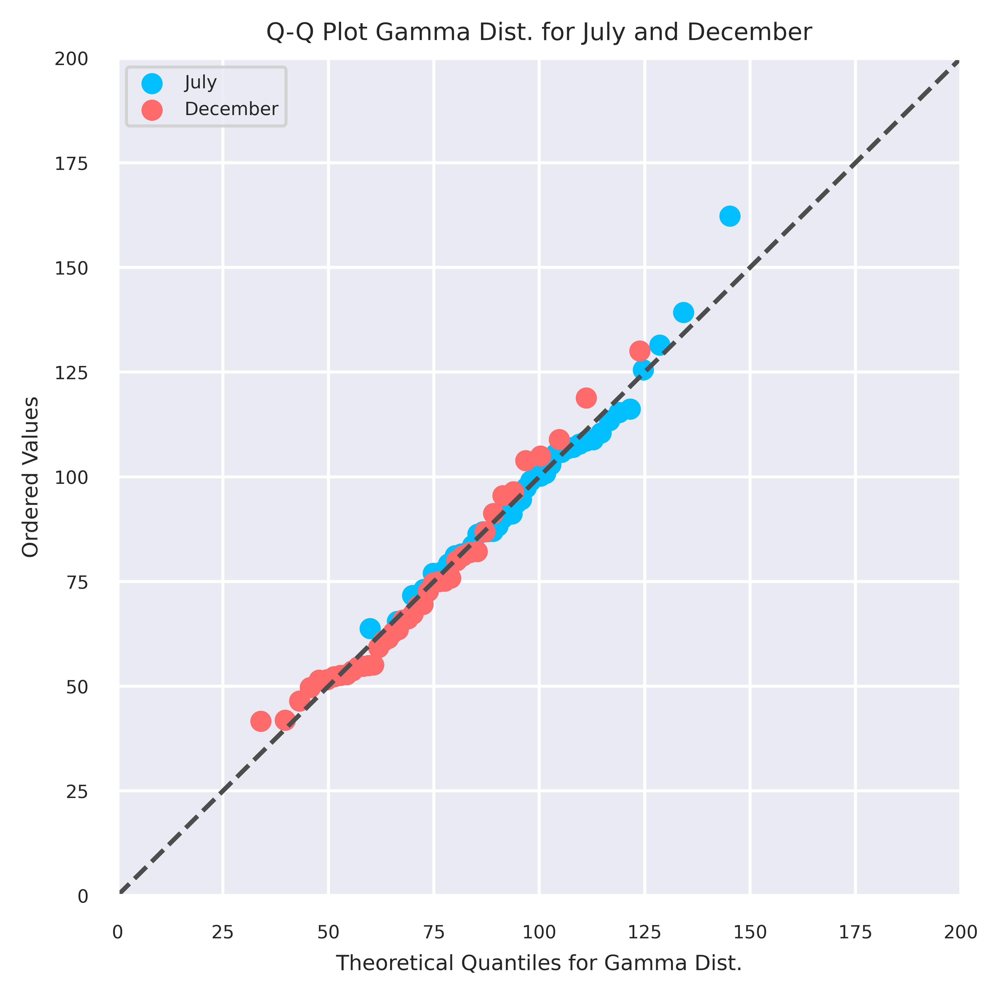

In [77]:
### prepare the data

months = ['July', 'December']

fig, ax = plt.subplots(1, 1, figsize=(5, 5), dpi=1000) 

sb_dark = sns.dark_palette('skyblue', 8, reverse=True)
sns.set(palette=sb_dark)

df_month_sel = df_month.tp[:,[6, 11]]

# create empty array for sorted and quantiles gamma
sort, quant = [], []

for i, month in enumerate(months):
    # select data for monthly groupby
    current_month_data = df_month_sel[:,i] 

    # fit gamma to find parameters for gamma dist. for each month
    shape, loc, scale = gamma.fit(current_month_data, floc=0)

    # calculate quantiles for selected months
    sorted_month_data = np.sort(current_month_data)
    sort.append(sorted_month_data)

    #print (sorted_month_data)
    quantiles_gamma = [gamma.ppf((j - 0.5) / len(sorted_month_data), 
                    a=shape, scale=scale) for j in range(1, len(sorted_month_data) + 1)]
    quant.append(quantiles_gamma)

# create array for the selected month
sort = np.array(sort)
quant = np.array(quant)

# create Q-Q plot
ax.scatter(quant[0], sort[0], color='#00BFFF', marker='o', label='July') 
ax.scatter(quant[1], sort[1], color='#FF6A6A', marker='o', label='December') 
ax.set(xlim=(0, 200), ylim=(0, 200))

# plot your initial diagonal line based on the starting
# xlims and ylims.
diag_line, = ax.plot(ax.get_xlim(), ax.get_ylim(), ls="--", c=".3")

def on_change(axes):
    # When this function is called it checks the current
    # values of xlim and ylim and modifies diag_line
    # accordingly.
    x_lims = ax.get_xlim()
    y_lims = ax.get_ylim()
    diag_line.set_data(x_lims, y_lims)

# Connect two callbacks to your axis instance.
# These will call the function "on_change" whenever
# xlim or ylim is changed.
ax.callbacks.connect('xlim_changed', on_change)
ax.callbacks.connect('ylim_changed', on_change)

ax.set_xlabel('Theoretical Quantiles for Gamma Dist.', fontsize=7)
ax.set_ylabel('Ordered Values', fontsize=7)
ax.set_title('Q-Q Plot Gamma Dist. for July and December', fontsize=8)
ax.tick_params(axis='both', which='major', labelsize=6)
ax.grid(True) 
ax.legend(loc='upper left', fontsize=6)
    

### No. 4

- Use only for July monthly precip. data, create a time series plot
- Transform to SPI time series
- Report the SPI values for 3 wttest and 3 driest year in the time series

In [100]:
### find the SPI only for July
# prepare data for July
df_july = df_month.tp[:, [6]]

# fit gamma dist. for July dataset
shape, loc, scale = gamma.fit(df_july, floc=0)

# find the gamma cdf from fitted gamma
gamma_dist = gamma.cdf(df_july, a=shape, scale=scale)

# find the SPI by inverting the July gamma dist. into normal dist. 
norm_spi = norm.ppf(gamma_dist, loc=0, scale=1) #loc = mean, scale=standard deviation

### plot the normal df time series and its SPI
# set the figure size 
fig = plt.figure(figsize=(12, 5), dpi=1000)
ax = fig.subplots()

# plot for July Precip.
prec = ax.plot(df_july.year, df_july, color='#00BFFF', label='Monthly Precip.')
ax.set_ylabel("Monthly Precip. (mmm)", fontsize=10, color='#00BFFF')
ax.set_xlabel("Year")
x_space = 3 # per three year
ax.xaxis.set_major_locator(ticker.MultipleLocator(x_space))
_ = plt.xticks(rotation=45, fontsize=8)
_ = plt.yticks(fontsize=12, color='#00BFFF')
ax.grid(False)

# plot the SPI as secondary axis
ax_twin = ax.twinx() 
spi = ax_twin.plot(df_july.year, norm_spi, 
                    color='#00688B', linestyle='--', linewidth=2,
                    marker ='X', label='SPI Index')
ax_twin.set_ylabel("SPI", fontsize=10, color='#00688B', fontweight='bold')
y_space = 0.5
ax_twin.yaxis.set_major_locator(ticker.MultipleLocator(y_space))
_ = plt.yticks(rotation=45, fontsize=8, color='#00688B', fontweight='bold')

# create legend for both axis
lns = prec + spi
labs = [l.get_label() for l in lns]
ax.legend(lns, labs, loc='best')

# create a title 
ax.set_title('Monthly Precipitation for July and Its Corresponding SPI')


Text(0.5, 1.0, 'Monthly Precipitation for July and Its Corresponding SPI')

## Part II. Extreme Values and Return Period

In [5]:
# open data
df = xr.open_dataset('../data/era5_tp_Midwest.nc')

# convert to mm/day
df_daily = df * 24 * 1000

### No. 1

- For each year, select the maximum precip. day
- Fit a GEV dist., and report the parameters of $\zeta$, $\beta$, and $\kappa$
- Report the 2-, 20-, and 100-year return period of precipitation 

In [6]:
### select the maximum daily precip  for each year
max_daily_precip = df_daily['tp'].groupby(df_daily['time.year']).max(dim='time')

### fit GEV dist.
a, b, c = genextreme.fit(max_daily_precip)
print('GEV paremeters from daily max. precip.')
print(r'$\zeta= %.2f, \beta = %.2f, \kappa = %.2f$' % (a, b, c) + '')

GEV paremeters from daily max. precip.
$\zeta= 0.46, \beta = 17.23, \kappa = 2.74$


In [44]:
### calculate the return period
# get probability based on the the asked period
T = np.array([2, 20, 100]) #2, 20, and 100 years
P = 1 - 1/T

# get the value of return period
for idx, i in enumerate(P):
    val = genextreme.ppf(i, a, b, c)
    print(f"The value for a " + str(T[idx]) + f"-year event is: {val:.2f}")

The value for a 2-year event is: 18.16
The value for a 20-year event is: 21.67
The value for a 100-year event is: 22.47


### No. 2

- Take all precip. values (excluding those less than 1 mm), and calculate the $98^{th}$ precentile
- Use the $98^{th}$ precentile value as threshold to select prec. greater than this value
- Fit a Generalized Pareto Dist. and report the $\kappa$ and $\sigma^{*}$
- Report the 2-, 20-, and 100-year return period of precipitation 

In [45]:
### filter daily precip. more than 1 mm
df_daily_filtered = df_daily.tp[df_daily.tp > 1]

### calculate the 98th precentile and use it as threshold
threshold = np.percentile(df_daily_filtered, 98)

### take all data more than threshold
df_filtered = df_daily_filtered[df_daily_filtered > threshold]

### fit the Generalized Pareto Dist. 
a, b, c = genpareto.fit(df_filtered)
print('Gen. Pareto paremeters from daily max. precip.')
print(r'$\xi= %.2f, \alpha = %.2f, \kappa = %.2f$' % (a, b, c) + '')


Gen. Pareto paremeters from daily max. precip.
$\xi= -1.27, \alpha = -0.09, \kappa = 28.34$


In [46]:
### calculate the return period
# get probability based on the the asked period
T = np.array([2, 20, 100]) #2, 20, and 100 years
P = 1 - 1/T

# get the value of return period
for idx, i in enumerate(P):
    val = genpareto.ppf(i, a, b, c)
    print(f"The value for a " + str(T[idx]) + f"-year event is: {val:.2f}")

The value for a 2-year event is: 12.99
The value for a 20-year event is: 21.81
The value for a 100-year event is: 22.25
